In [1]:
import os
import urllib.request
import tarfile
import gzip
import shutil

In [2]:
os.makedirs('data')

In [3]:
url = 'https://raw.githubusercontent.com/ageron/handson-ml2/master/datasets/housing/housing.tgz'
urllib.request.urlretrieve(url, 'data/housing.tgz')

('data/housing.tgz', <http.client.HTTPMessage at 0x112679450>)

In [4]:
file = tarfile.open('data/housing.tgz')
file.extractall('./data')
file.close()
os.remove('data/housing.tgz')

In [5]:
with open('./data/housing.csv', 'rb') as f_in:
    with gzip.open('./data/housing.csv.gz', 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)

In [28]:
import pandas as pd

df = pd.read_csv('data/housing.csv.gz')

In [7]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [9]:
df['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

In [10]:
import matplotlib.pyplot as plt

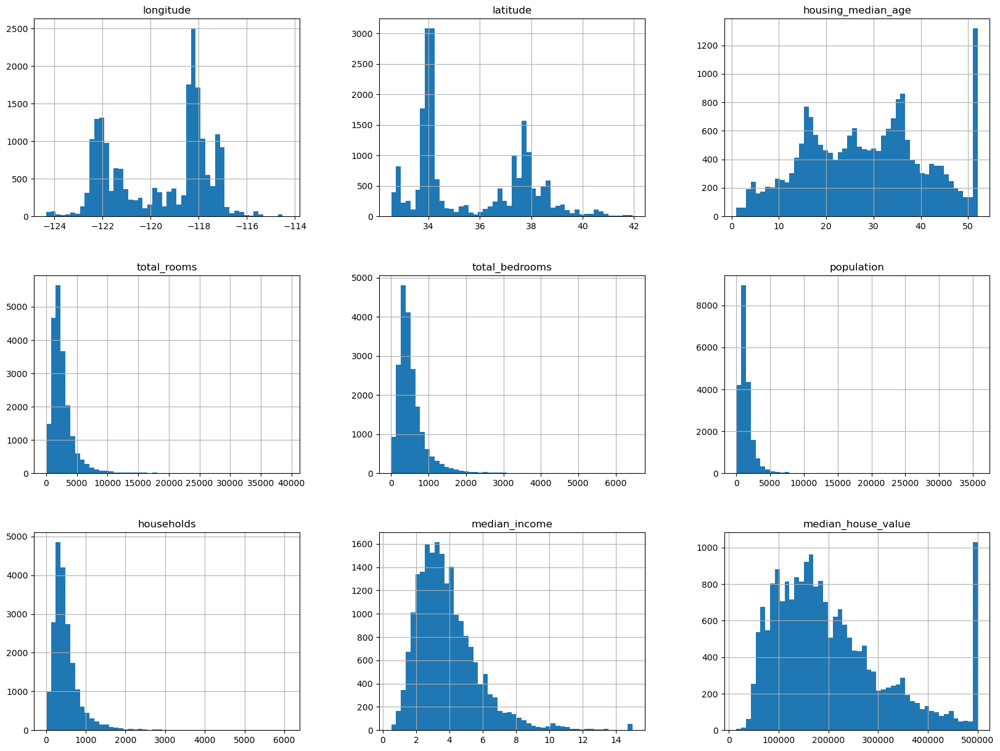

In [11]:
df.hist(bins=50, figsize=(20,15))

plt.savefig('obraz1.png')

In [12]:
df['ocean_proximity'].describe()

count         20640
unique            5
top       <1H OCEAN
freq           9136
Name: ocean_proximity, dtype: object

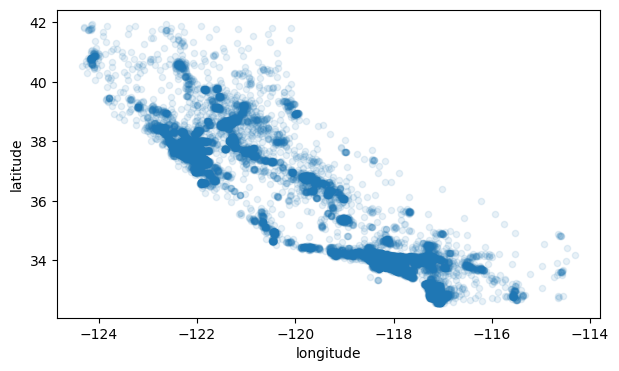

In [13]:
df.plot(kind="scatter", x="longitude", y="latitude",
alpha=0.1, figsize=(7,4))

plt.savefig('obraz2.png')

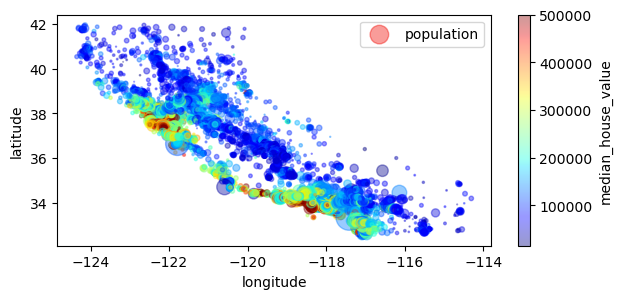

In [14]:
df.plot(kind="scatter", x="longitude", y="latitude",
alpha=0.4, figsize=(7,3), colorbar=True,
s=df["population"]/100, label="population",
c="median_house_value", cmap=plt.get_cmap("jet"))

plt.savefig('obraz3.png')

In [15]:
pd.get_dummies(df).corr()["median_house_value"].sort_values(ascending=False)

median_house_value            1.000000
median_income                 0.688075
ocean_proximity_<1H OCEAN     0.256617
ocean_proximity_NEAR BAY      0.160284
ocean_proximity_NEAR OCEAN    0.141862
total_rooms                   0.134153
housing_median_age            0.105623
households                    0.065843
total_bedrooms                0.049686
ocean_proximity_ISLAND        0.023416
population                   -0.024650
longitude                    -0.045967
latitude                     -0.144160
ocean_proximity_INLAND       -0.484859
Name: median_house_value, dtype: float64

In [16]:
pd.get_dummies(df).corr()['median_house_value'].sort_values(ascending=False).reset_index().rename(columns={"index": "atrybut", "median_house_value": "wspolczynnik_korelacji"}).to_csv("korelacja.csv", index=False)

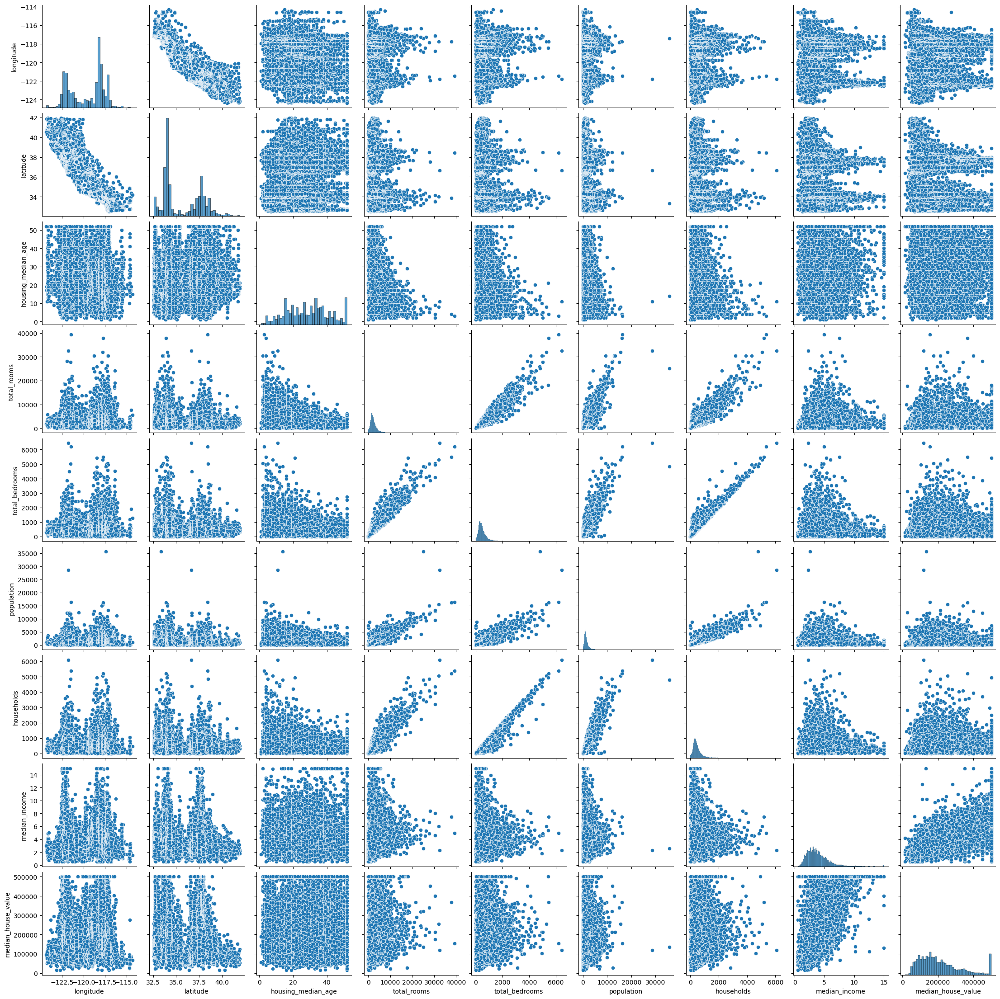

In [17]:
import seaborn as sns

sns.pairplot(df)

In [18]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(pd.get_dummies(df), test_size=0.2, random_state=42)
len(train_set), len(test_set)

(16512, 4128)

In [19]:
train_set.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
19312,-122.86,38.44,31.0,1534.0,292.0,716.0,288.0,3.4471,209500.0,True,False,False,False,False
5315,-118.43,34.06,31.0,1317.0,284.0,523.0,274.0,7.4219,500001.0,True,False,False,False,False
16449,-121.27,38.14,40.0,929.0,257.0,576.0,229.0,2.1250,137500.0,False,True,False,False,False
16200,-121.27,37.95,52.0,1318.0,308.0,1368.0,310.0,1.8261,54600.0,False,True,False,False,False
15548,-117.09,33.12,11.0,567.0,184.0,620.0,163.0,2.5284,122500.0,True,False,False,False,False


In [20]:
test_set.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
10381,-117.63,33.63,6.0,3068.0,549.0,985.0,536.0,4.2009,238000.0,True,False,False,False,False
17036,-122.25,37.50,45.0,1812.0,336.0,752.0,329.0,4.9500,345000.0,False,False,False,False,True
3335,-122.64,38.87,16.0,1177.0,240.0,519.0,199.0,1.5739,73500.0,False,True,False,False,False
17353,-120.43,34.89,30.0,1979.0,342.0,999.0,320.0,5.0286,158000.0,True,False,False,False,False
6541,-118.05,34.04,33.0,1348.0,NaN,1098.0,257.0,4.2917,161200.0,True,False,False,False,False


In [21]:
train_set.corr()['median_house_value'].sort_values(ascending=False)

median_house_value            1.000000
median_income                 0.690647
ocean_proximity_<1H OCEAN     0.258544
ocean_proximity_NEAR BAY      0.162134
ocean_proximity_NEAR OCEAN    0.134263
total_rooms                   0.133989
housing_median_age            0.103706
households                    0.063714
total_bedrooms                0.047980
ocean_proximity_ISLAND        0.020983
population                   -0.026032
longitude                    -0.046349
latitude                     -0.142983
ocean_proximity_INLAND       -0.482862
Name: median_house_value, dtype: float64

In [22]:
test_set.corr()['median_house_value'].sort_values(ascending=False)

median_house_value            1.000000
median_income                 0.677502
ocean_proximity_<1H OCEAN     0.248648
ocean_proximity_NEAR OCEAN    0.172026
ocean_proximity_NEAR BAY      0.152416
total_rooms                   0.134697
housing_median_age            0.113585
households                    0.074249
total_bedrooms                0.056667
ocean_proximity_ISLAND        0.033247
population                   -0.019003
longitude                    -0.044062
latitude                     -0.149295
ocean_proximity_INLAND       -0.492888
Name: median_house_value, dtype: float64

In [23]:
((test_set.corr()['median_house_value']-train_set.corr()['median_house_value'])).sort_values(ascending=False)

ocean_proximity_NEAR OCEAN    0.037763
ocean_proximity_ISLAND        0.012264
households                    0.010534
housing_median_age            0.009879
total_bedrooms                0.008687
population                    0.007030
longitude                     0.002286
total_rooms                   0.000708
median_house_value            0.000000
latitude                     -0.006311
ocean_proximity_NEAR BAY     -0.009717
ocean_proximity_<1H OCEAN    -0.009896
ocean_proximity_INLAND       -0.010026
median_income                -0.013145
Name: median_house_value, dtype: float64

In [24]:
train_set.to_pickle('train_set.pkl')
test_set.to_pickle('test_set.pkl')

In [25]:
pd.options.plotting.backend = "plotly"

In [26]:
df.plot(kind="scatter", x="longitude", y="latitude")

In [29]:
import plotly.express as px
fig = px.histogram(df)
fig.show()

ValueError: Plotly Express cannot process wide-form data with columns of different type.